# Week 9 – Day 1 Lab
## Stable Diffusion: Text-to-Image Generation

### Objectives

By the end of this lab, you will:
- Generate images using Stable Diffusion.
- Understand how prompts influence image generation.
- Experiment with inference steps, CFG scale, and random seeds.
- Build a mini AI-generated image gallery.


# Step 1: Enable GPU Runtime

Stable Diffusion requires significant computational power to generate images efficiently. Google Colab provides free access to GPUs, which can greatly speed up image generation.

Before proceeding, switch your notebook to use a GPU.

### Instructions

1. Click **Runtime** in the top menu.
2. Select **Change runtime type**.
3. Under **Hardware accelerator**, choose **T4 GPU** (or any available GPU).
4. Click **Save**.

### Verify that the GPU is Available

Run the code cell below to check whether your notebook is connected to a GPU. If the GPU is available, the output should display the name of the GPU (e.g., NVIDIA Tesla T4).

In [1]:
import torch

if torch.cuda.is_available():
    print("✅ GPU is available!")
    print("GPU Name:", torch.cuda.get_device_name(0))
else:
    print("❌ GPU is not available. Please enable GPU from Runtime → Change runtime type.")

✅ GPU is available!
GPU Name: Tesla T4


# Step 2: Install Required Libraries

Stable Diffusion is not included in Google Colab by default, so we first need to install the required Python libraries.

The following packages will be installed:

- **diffusers** – Provides Stable Diffusion models.
- **transformers** – Used for text encoding.
- **accelerate** – Optimizes model execution.
- **safetensors** – Secure model loading.

Run the following cell to install these packages.

In [2]:
!pip install -q diffusers transformers accelerate safetensors

# Step 3: Import Required Libraries

Now that the required packages are installed, we need to import them into our notebook.

We will use:

- **torch** for tensor computations.
- **StableDiffusionPipeline** to load the pre-trained model.
- **matplotlib** to display generated images.

Run the following cell.

In [3]:
import torch
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


#Load the Stable Diffusion Model

Stable Diffusion is a pre-trained generative AI model capable of converting text descriptions into images.

In this step, we will load the model and prepare it for image generation.

**Note:** The first execution may take several minutes because the model needs to be downloaded.


Hints:

- Use StableDiffusionPipeline.from_pretrained()
- The model name is:
  runwayml/stable-diffusion-v1-5
- Move the pipeline to the GPU.

In [4]:
#write your code here
model_id = "runwayml/stable-diffusion-v1-5"

pipe = StableDiffusionPipeline.from_pretrained(
    model_id,
    torch_dtype=torch.float16)

pipe = pipe.to("cuda")

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

# Generate Your First AI Image

Let's generate your first AI image!



Complete the code below to generate an image for the following prompt:

> "A futuristic city at sunset"

Display the generated image.

  0%|          | 0/50 [00:00<?, ?it/s]

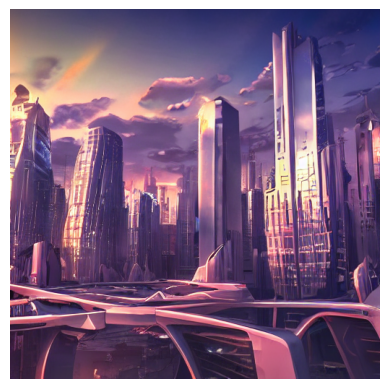

In [5]:
#write your code here
prompt = "A futuristic city at sunset"

image = pipe(prompt).images[0]

plt.imshow(image)
plt.axis("off")
plt.show()

# Experiment 1: Prompt Engineering

The quality of an AI-generated image depends greatly on the prompt.

Generate images using both prompts below.

### Prompt 1

Dog

### Prompt 2

A golden retriever running on a beach during sunset, cinematic lighting, highly detailed, realistic photography



generate both images.

  0%|          | 0/50 [00:00<?, ?it/s]

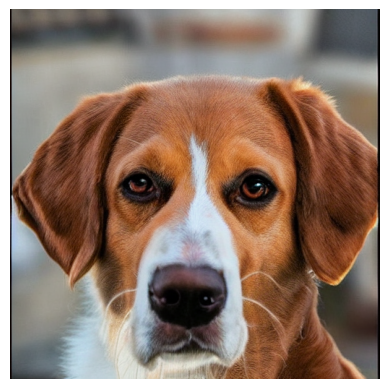

In [6]:
#write code here
prompt1 = "Dog"

image1 = pipe(prompt1).images[0]

plt.imshow(image1)
plt.axis("off")
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

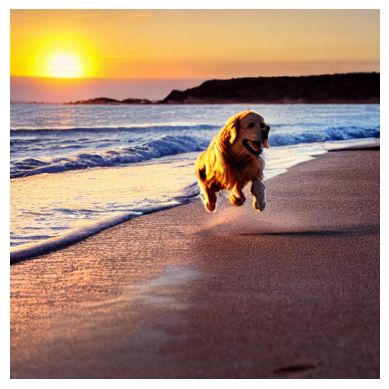

In [7]:
#write code here
prompt2 = "A golden retriever running on a beach during sunset, cinematic lighting, highly detailed, realistic photography"

image2 = pipe(prompt2).images[0]

plt.imshow(image2)
plt.axis("off")
plt.show()

## Reflection

1. Which prompt generated the better image?

2. Which image contained more details?

3. Why do detailed prompts usually produce better results?

In [8]:
#answer here
# Reflection

print("1. Which prompt generated the better image?")
print("Prompt 2 generated the better image because it provided specific details.")

print("\n2. Which image contained more details?")
print("Prompt 2 contained more details because it specified the dog, beach, sunset, lighting, and realistic style.")

print("\n3. Why do detailed prompts usually produce better results?")
print("Detailed prompts give the AI clearer instructions about what to generate and how it should look.")

1. Which prompt generated the better image?
Prompt 2 generated the better image because it provided specific details.

2. Which image contained more details?
Prompt 2 contained more details because it specified the dog, beach, sunset, lighting, and realistic style.

3. Why do detailed prompts usually produce better results?
Detailed prompts give the AI clearer instructions about what to generate and how it should look.


# Experiment 2: Inference Steps

Stable Diffusion gradually removes noise over multiple iterations.

These iterations are called **Inference Steps**.


Generate the same image using:

- 20 inference steps
- 50 inference steps

  0%|          | 0/20 [00:00<?, ?it/s]

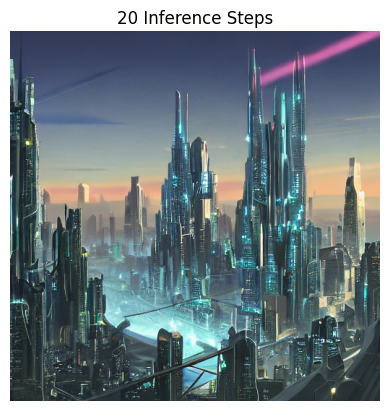

In [9]:
#write your code here
prompt = "A futuristic city at sunset"

image_20 = pipe(
    prompt,
    num_inference_steps=20
).images[0]

plt.imshow(image_20)
plt.title("20 Inference Steps")
plt.axis("off")
plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

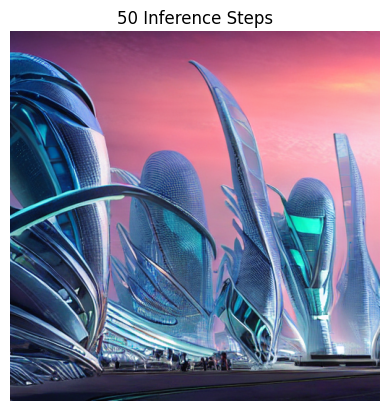

In [10]:
#write your code here
image_50 = pipe(
    prompt,
    num_inference_steps=50
).images[0]

plt.imshow(image_50)
plt.title("50 Inference Steps")
plt.axis("off")
plt.show()

## Reflection

- Which image looks sharper?

- Was there a noticeable improvement?

- Did image generation take longer?

In [11]:
#answer here
# Reflection

print("1. Which image looks sharper?")
print("The image generated with 50 inference steps looks sharper and more refined.")

print("\n2. Was there a noticeable improvement?")
print("Yes. The 50-step image has better details, smoother textures, and clearer edges.")

print("\n3. Did image generation take longer?")
print("Yes. 50 inference steps took longer because the model performed more iterations.")

1. Which image looks sharper?
The image generated with 50 inference steps looks sharper and more refined.

2. Was there a noticeable improvement?
Yes. The 50-step image has better details, smoother textures, and clearer edges.

3. Did image generation take longer?
Yes. 50 inference steps took longer because the model performed more iterations.


# Experiment 3: Guidance Scale (CFG)

CFG controls how closely Stable Diffusion follows your prompt.


Generate the same prompt using:

- CFG = 5
- CFG = 8
- CFG = 12



  0%|          | 0/50 [00:00<?, ?it/s]

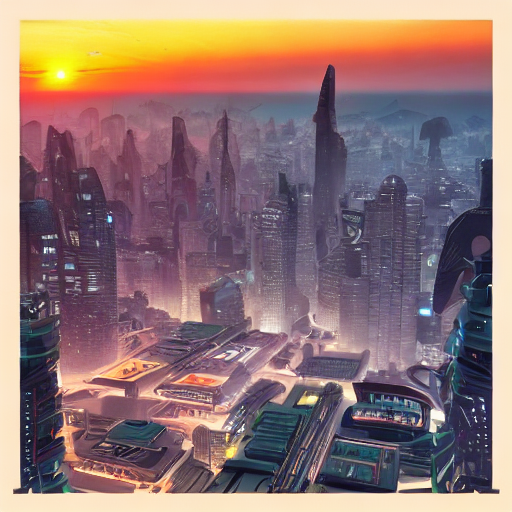

In [12]:
#write code here cfg=5
image_cfg5 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=5
).images[0]

display(image_cfg5)

  0%|          | 0/50 [00:00<?, ?it/s]

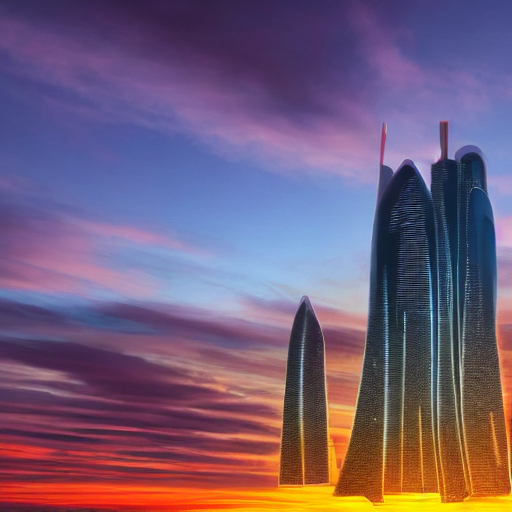

In [13]:
#write code here cfg = 8
image_cfg8 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=8
).images[0]

display(image_cfg8)

  0%|          | 0/50 [00:00<?, ?it/s]

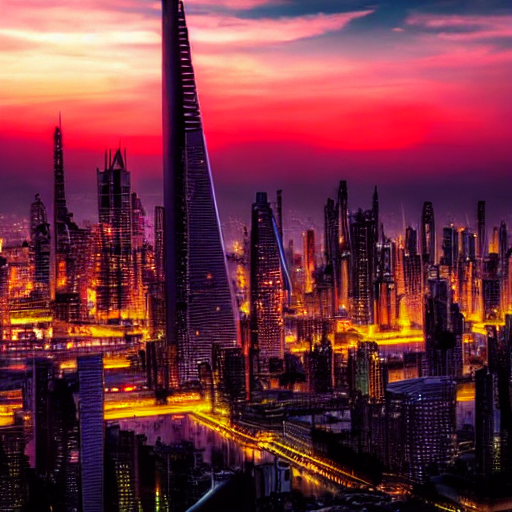

In [14]:
#write code here cfg = 12
image_cfg12 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=12
).images[0]

display(image_cfg12)

## Reflection

- Which CFG value produced the best image?

- Which image followed the prompt most accurately?

- What happens when CFG becomes too high?

In [15]:
#answer here
# Reflection

print("1. Which CFG value produced the best image?")
print("CFG = 8 produced the best overall image with a good balance between quality and prompt adherence.")

print("\n2. Which image followed the prompt most accurately?")
print("CFG = 12 followed the prompt most closely because higher CFG gives more importance to the text prompt.")

print("\n3. What happens when CFG becomes too high?")
print("When CFG becomes too high, the image can look over-processed, unnatural, overly sharp, or distorted.")

1. Which CFG value produced the best image?
CFG = 8 produced the best overall image with a good balance between quality and prompt adherence.

2. Which image followed the prompt most accurately?
CFG = 12 followed the prompt most closely because higher CFG gives more importance to the text prompt.

3. What happens when CFG becomes too high?
When CFG becomes too high, the image can look over-processed, unnatural, overly sharp, or distorted.


# Experiment 4: Random Seed

Every image starts from random noise.

Changing the seed changes the starting noise, resulting in different images.



Complete the code below.

Generate images using the following seeds:

- 42
- 100
- 500



  0%|          | 0/50 [00:00<?, ?it/s]

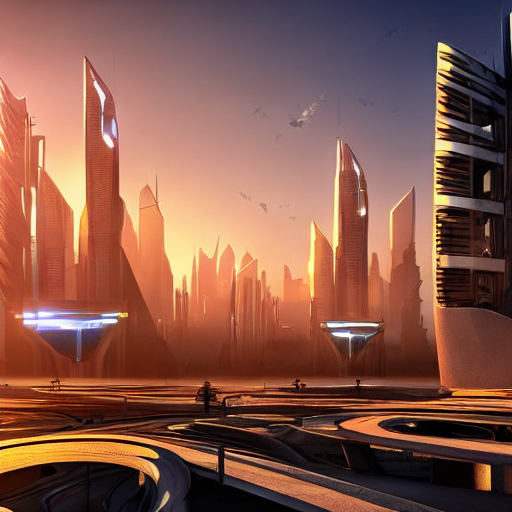

In [16]:
#write code here 42
import torch

generator = torch.Generator(device="cuda").manual_seed(42)

image_seed42 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=8,
    generator=generator
).images[0]

display(image_seed42)

  0%|          | 0/50 [00:00<?, ?it/s]

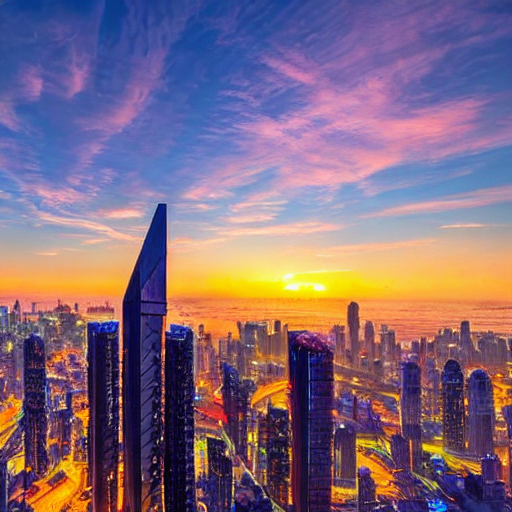

In [17]:
#write code here 100
generator = torch.Generator(device="cuda").manual_seed(100)

image_seed100 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=8,
    generator=generator
).images[0]

display(image_seed100)

  0%|          | 0/50 [00:00<?, ?it/s]

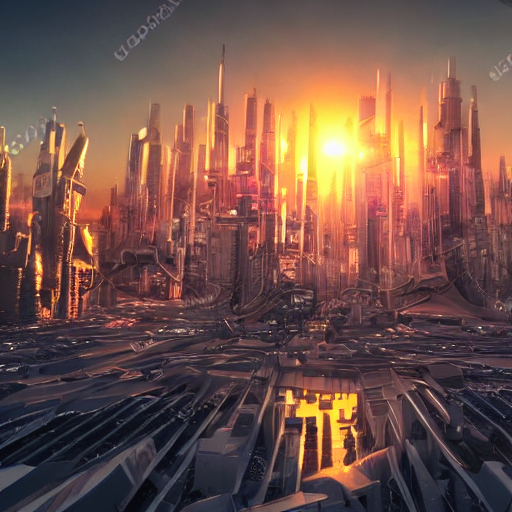

In [18]:
#write code here 500
generator = torch.Generator(device="cuda").manual_seed(500)

image_seed500 = pipe(
    prompt,
    num_inference_steps=50,
    guidance_scale=8,
    generator=generator
).images[0]

display(image_seed500)

## Reflection

- Which seed generated your favorite image?

- What changed when the seed changed?

- Why are seeds useful when reproducing results?

In [19]:
#answer here
# Reflection

print("1. Which seed generated your favorite image?")
print("Seed = 42 generated my favorite image.")

print("\n2. What changed when the seed changed?")
print("The composition, shapes, colors, and small details of the generated image changed.")

print("\n3. Why are seeds useful when reproducing results?")
print("Seeds make the random starting noise consistent, allowing us to reproduce the same image using the same prompt and settings.")

1. Which seed generated your favorite image?
Seed = 42 generated my favorite image.

2. What changed when the seed changed?
The composition, shapes, colors, and small details of the generated image changed.

3. Why are seeds useful when reproducing results?
Seeds make the random starting noise consistent, allowing us to reproduce the same image using the same prompt and settings.


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=5 | Steps=20 | Time=4.98s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=5 | Steps=50 | Time=8.32s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=8 | Steps=20 | Time=3.69s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=8 | Steps=50 | Time=8.71s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=12 | Steps=20 | Time=3.83s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=12 | Steps=50 | Time=9.04s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=5 | Steps=20 | Time=3.81s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=5 | Steps=50 | Time=8.59s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=8 | Steps=20 | Time=3.66s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=8 | Steps=50 | Time=8.37s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=12 | Steps=20 | Time=3.58s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=12 | Steps=50 | Time=8.28s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=5 | Steps=20 | Time=3.58s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=5 | Steps=50 | Time=8.33s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=8 | Steps=20 | Time=3.61s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=8 | Steps=50 | Time=8.47s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=12 | Steps=20 | Time=3.67s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=12 | Steps=50 | Time=9.54s


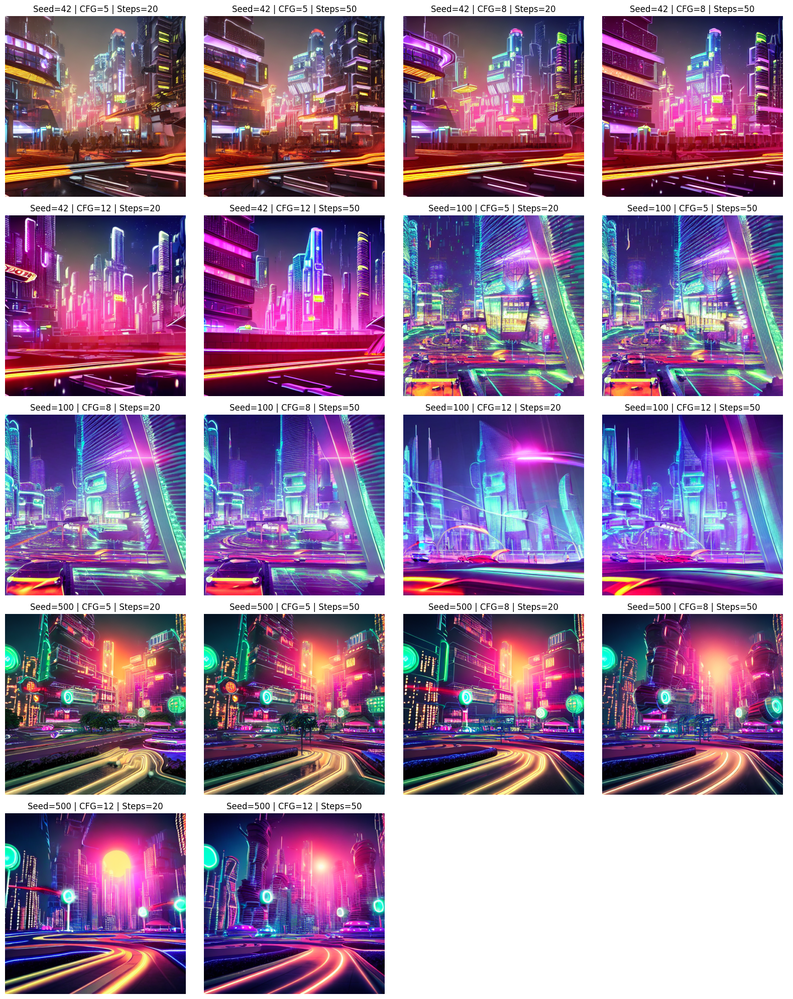

,Seed,CFG,Inference Steps,Generation Time (sec)
0,42,5,20,4.98
1,42,5,50,8.32
2,42,8,20,3.69
3,42,8,50,8.71
4,42,12,20,3.83
5,42,12,50,9.04
6,100,5,20,3.81
7,100,5,50,8.59
8,100,8,20,3.66
9,100,8,50,8.37


In [20]:
#Practice Example

import torch
import time
import pandas as pd
import matplotlib.pyplot as plt

prompt = "A futuristic city at night, neon lights, flying cars, highly detailed, cinematic lighting"

seeds = [42, 100, 500]
cfg_values = [5, 8, 12]
steps_values = [20, 50]

results = []

for seed in seeds:
    for cfg in cfg_values:
        for steps in steps_values:

            generator = torch.Generator(device="cuda").manual_seed(seed)

            start_time = time.time()

            image = pipe(
                prompt,
                num_inference_steps=steps,
                guidance_scale=cfg,
                generator=generator
            ).images[0]

            generation_time = time.time() - start_time

            results.append({
                "Seed": seed,
                "CFG": cfg,
                "Steps": steps,
                "Time": generation_time,
                "Image": image
            })

            print(
                f"Seed={seed} | CFG={cfg} | "
                f"Steps={steps} | Time={generation_time:.2f}s"
            )

# Display all 18 generated images
fig, axes = plt.subplots(5, 4, figsize=(16, 20))
axes = axes.flatten()

for ax, result in zip(axes, results):
    ax.imshow(result["Image"])
    ax.set_title(
        f"Seed={result['Seed']} | "
        f"CFG={result['CFG']} | "
        f"Steps={result['Steps']}"
    )
    ax.axis("off")

# Hide unused subplot
for ax in axes[len(results):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

# Create comparison table
df = pd.DataFrame([
    {
        "Seed": r["Seed"],
        "CFG": r["CFG"],
        "Inference Steps": r["Steps"],
        "Generation Time (sec)": round(r["Time"], 2)
    }
    for r in results
])

display(df)

  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=5 | Steps=20 | Time=3.99s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=5 | Steps=50 | Time=8.68s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=8 | Steps=20 | Time=3.78s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=8 | Steps=50 | Time=8.94s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=42 | CFG=12 | Steps=20 | Time=4.08s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=42 | CFG=12 | Steps=50 | Time=9.11s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=5 | Steps=20 | Time=3.74s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=5 | Steps=50 | Time=8.53s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=8 | Steps=20 | Time=3.65s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=8 | Steps=50 | Time=8.31s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=100 | CFG=12 | Steps=20 | Time=3.60s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=100 | CFG=12 | Steps=50 | Time=8.29s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=5 | Steps=20 | Time=3.61s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=5 | Steps=50 | Time=8.35s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=8 | Steps=20 | Time=3.64s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=8 | Steps=50 | Time=8.49s


  0%|          | 0/20 [00:00<?, ?it/s]

Seed=500 | CFG=12 | Steps=20 | Time=3.70s


  0%|          | 0/50 [00:00<?, ?it/s]

Seed=500 | CFG=12 | Steps=50 | Time=8.55s


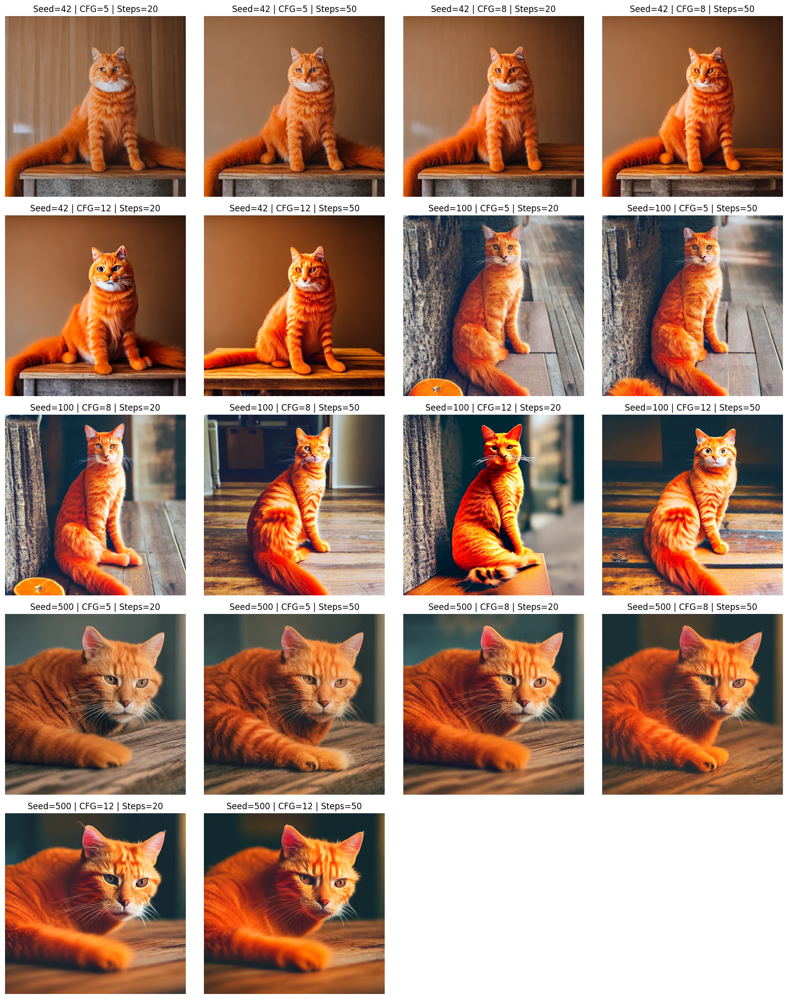

,Seed,CFG,Inference Steps,Generation Time (sec)
0,42,5,20,3.99
1,42,5,50,8.68
2,42,8,20,3.78
3,42,8,50,8.94
4,42,12,20,4.08
5,42,12,50,9.11
6,100,5,20,3.74
7,100,5,50,8.53
8,100,8,20,3.65
9,100,8,50,8.31


In [21]:
#Practice question related to CAT
import torch
import time
import pandas as pd
import matplotlib.pyplot as plt

prompt = "A realistic orange cat sitting on a wooden table, soft natural lighting, detailed fur, cinematic photography"

seeds = [42, 100, 500]
cfg_values = [5, 8, 12]
steps_values = [20, 50]

results = []

for seed in seeds:
    for cfg in cfg_values:
        for steps in steps_values:

            generator = torch.Generator(device="cuda").manual_seed(seed)

            start_time = time.time()

            image = pipe(
                prompt,
                num_inference_steps=steps,
                guidance_scale=cfg,
                generator=generator
            ).images[0]

            generation_time = time.time() - start_time

            results.append({
                "Seed": seed,
                "CFG": cfg,
                "Steps": steps,
                "Time": generation_time,
                "Image": image
            })

            print(
                f"Seed={seed} | CFG={cfg} | "
                f"Steps={steps} | Time={generation_time:.2f}s"
            )

# Display generated images
fig, axes = plt.subplots(5, 4, figsize=(16, 20))
axes = axes.flatten()

for ax, result in zip(axes, results):
    ax.imshow(result["Image"])
    ax.set_title(
        f"Seed={result['Seed']} | "
        f"CFG={result['CFG']} | "
        f"Steps={result['Steps']}"
    )
    ax.axis("off")

for ax in axes[len(results):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

# Comparison table
df = pd.DataFrame([
    {
        "Seed": r["Seed"],
        "CFG": r["CFG"],
        "Inference Steps": r["Steps"],
        "Generation Time (sec)": round(r["Time"], 2)
    }
    for r in results
])

display(df)